In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_parquet("data/merged_topic_and_frames_filtered_with_time_and_frames.parquet")
frame_cols = [c for c in df.columns if c.startswith("frame_")]
outlets = df["outlet_name"].unique().tolist()

In [3]:
# Compute mean frame variance for each topic
topic_frame_mapping = df.groupby(["topic_top1", "outlet_name"])[frame_cols].mean()
topic_variance = topic_frame_mapping.groupby("topic_top1")[frame_cols].var()
topic_variance_mean = topic_variance.mean(axis=1)
top_topics = topic_variance_mean.sort_values(ascending=False).head(20)

for topic in top_topics.index:
    print(f"TOPIC: {topic}")
    print(f"Mean variance: {topic_variance_mean[topic]:.6f}")
    
    # print frame variance for the topic sorted high → low
    frame_var = topic_variance.loc[topic].sort_values(ascending=False)
    print(frame_var.to_string())

TOPIC: Russia
Mean variance: 0.026857
frame_quality_life    0.047269
frame_political       0.045204
frame_crime           0.038612
frame_security        0.034700
frame_economic        0.034572
frame_regulation      0.029834
frame_culture         0.029526
frame_legality        0.029406
frame_policy          0.025361
frame_fairness        0.024307
frame_public_op       0.015776
frame_cap&res         0.015671
frame_health          0.004307
frame_morality        0.001457
TOPIC: China
Mean variance: 0.021729
frame_legality        0.039991
frame_quality_life    0.039972
frame_regulation      0.037029
frame_economic        0.031758
frame_culture         0.024158
frame_fairness        0.022991
frame_security        0.022479
frame_cap&res         0.017515
frame_policy          0.016545
frame_crime           0.014233
frame_public_op       0.013891
frame_political       0.010521
frame_morality        0.007651
frame_health          0.005474
TOPIC: immigration
Mean variance: 0.016924
frame_quality_

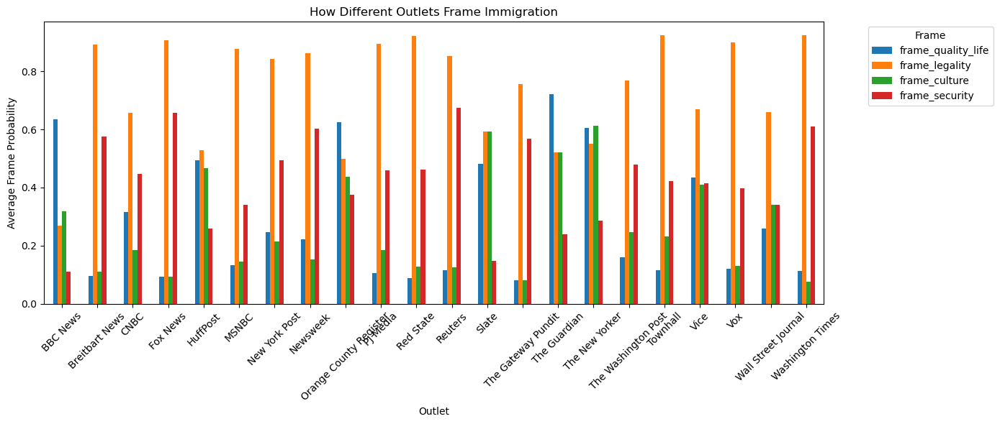

In [4]:
# Framing Differences for Immigration
topic = "immigration"

frame_var = topic_variance.loc[topic]
cutoff = frame_var.quantile(0.75)

high_var_frames = frame_var[frame_var >= cutoff].sort_values(ascending=False).index.tolist()
immigration = df[df["topic_top1"] == topic]
frame_by_outlet_immigration = immigration.groupby("outlet_name")[frame_cols].mean()[high_var_frames]


ax = frame_by_outlet_immigration.plot(kind="bar", figsize=(14,6))
plt.title("How Different Outlets Frame Immigration")
plt.ylabel("Average Frame Probability")
plt.xlabel("Outlet")
plt.xticks(rotation=45)
plt.legend(title="Frame", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

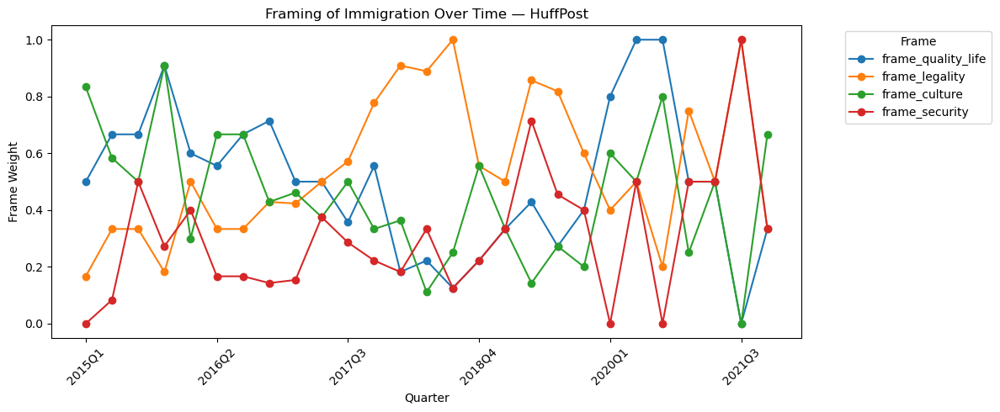

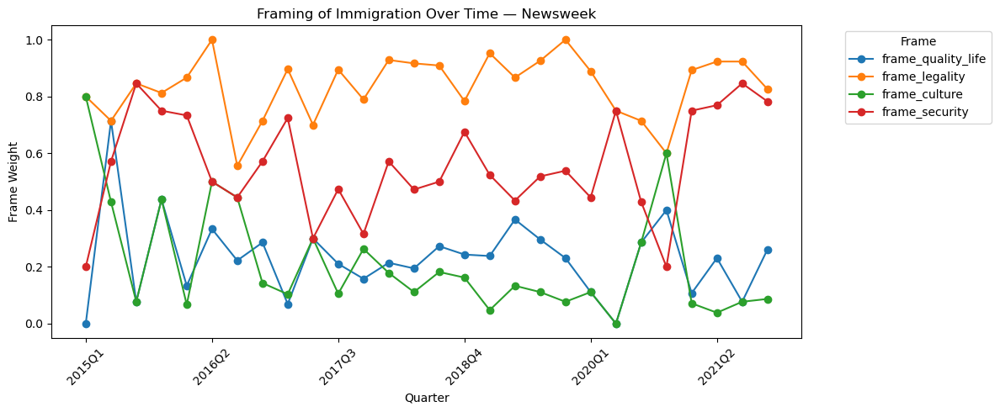

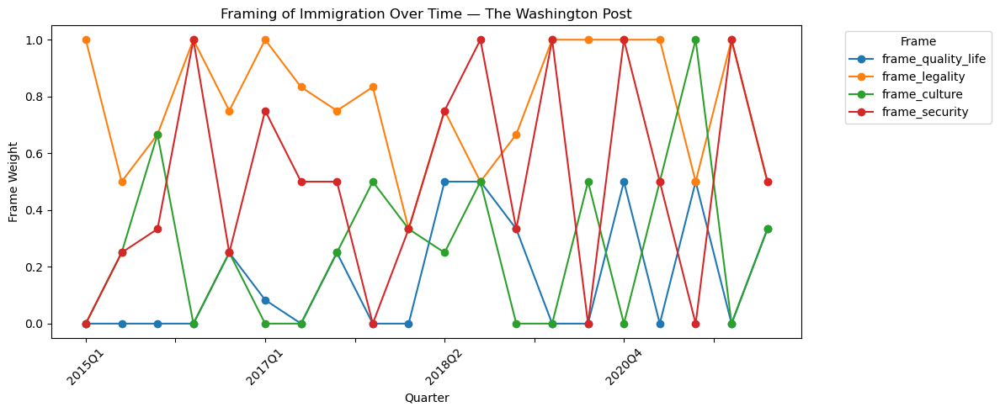

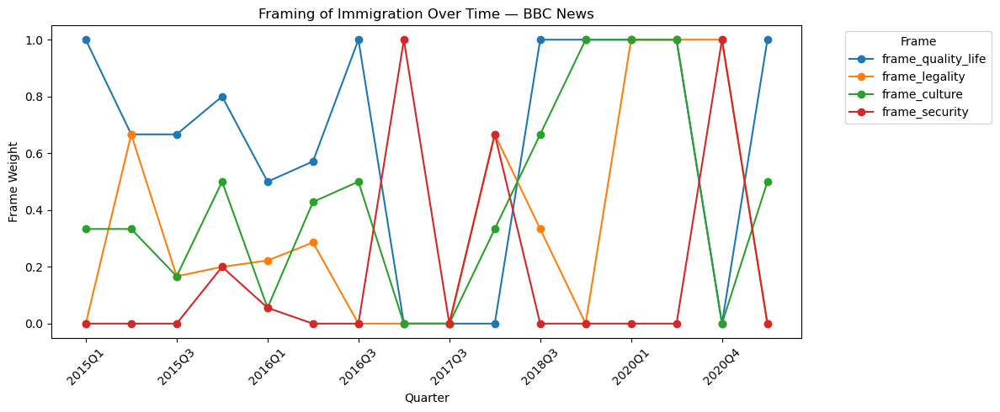

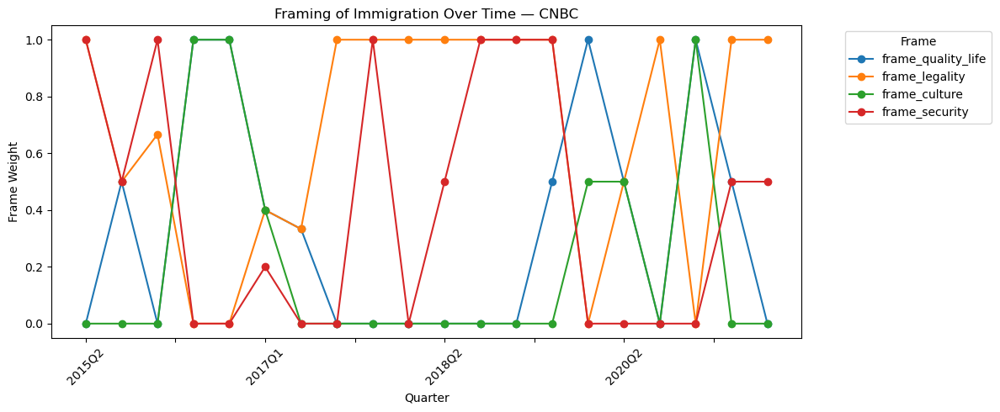

...

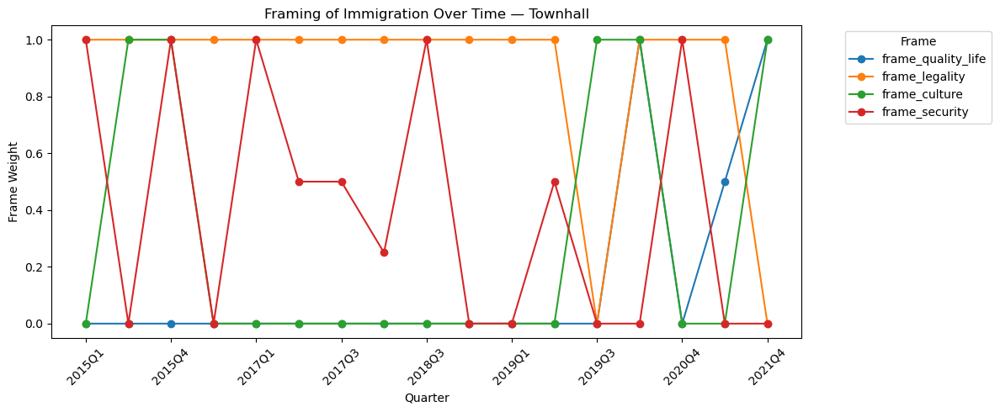

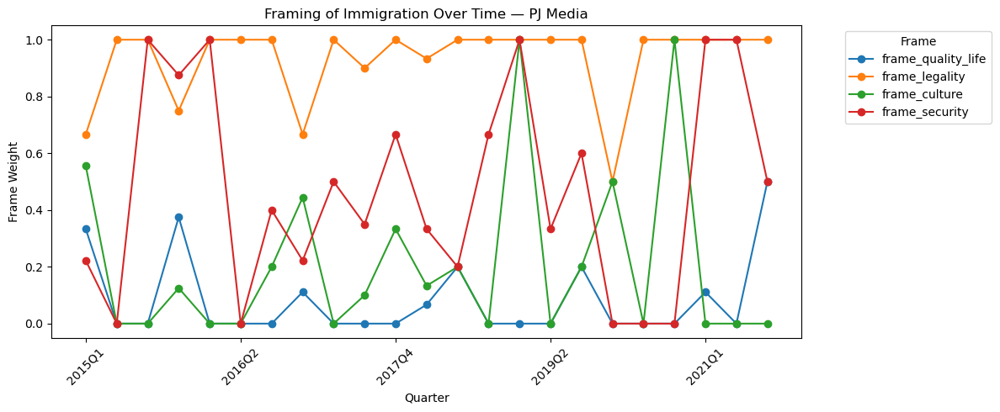

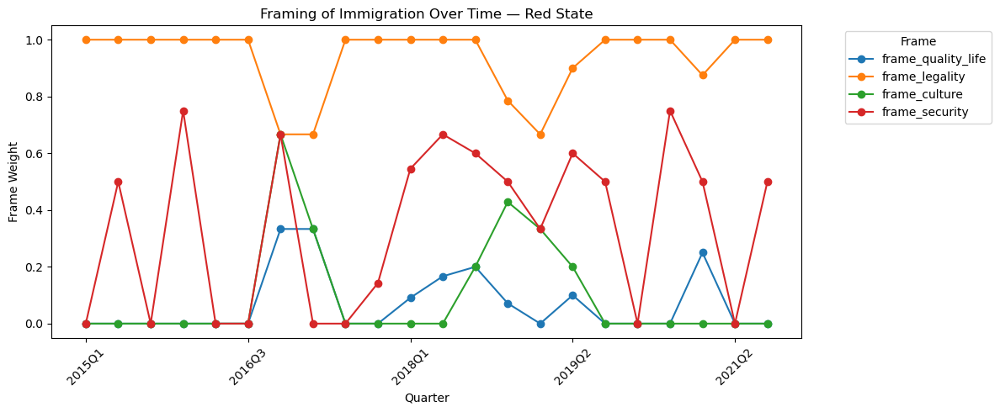

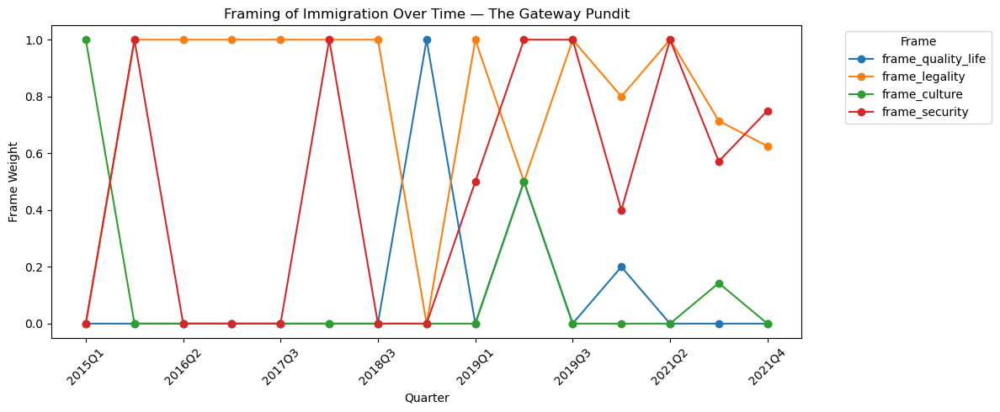

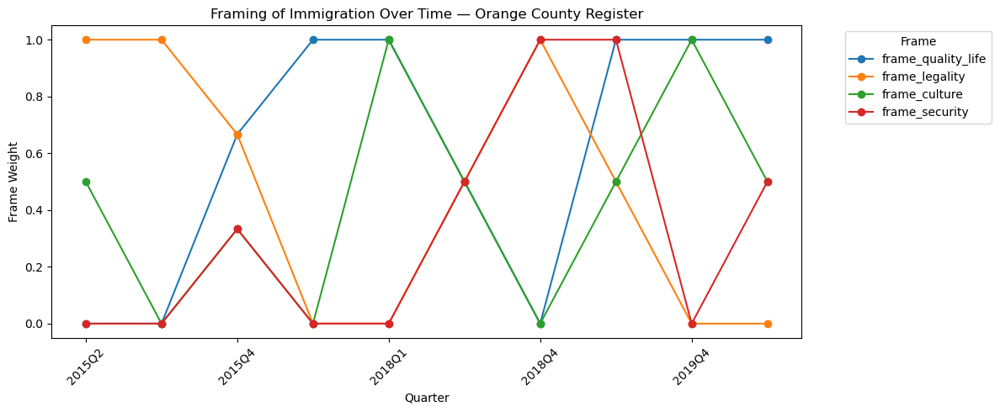

In [5]:
# Framing Differences for Immigration over time by outlet
for outlet in outlets:        
    immigration_time = immigration.groupby(["quarter","outlet_name"])[frame_cols].mean()
    # isolate chosen outlet
    immigration_time_outlet = immigration_time.xs(outlet, level="outlet_name")
    
    # plot
    ax = immigration_time_outlet[high_var_frames].plot(figsize=(12,5), marker='o')
    plt.title(f"Framing of Immigration Over Time — {outlet}")
    plt.ylabel("Frame Weight")
    plt.xlabel("Quarter")
    plt.xticks(rotation=45)
    plt.legend(title="Frame", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

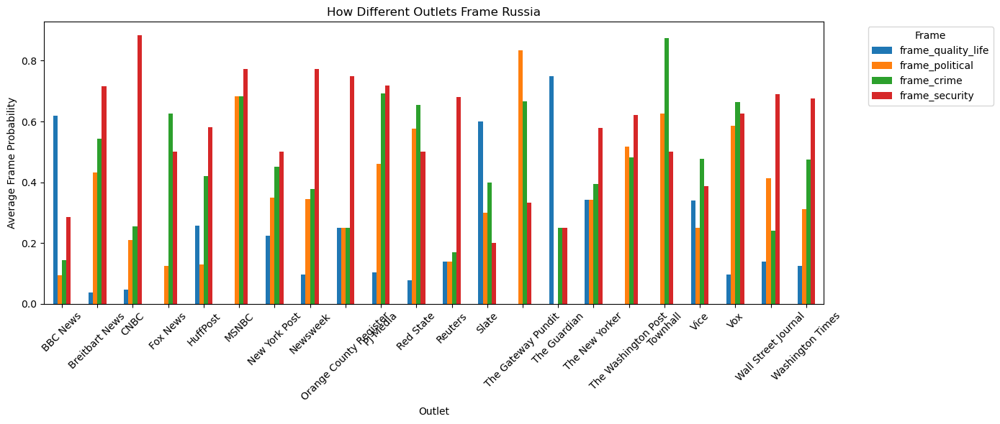

In [6]:
# Framing Differences for Russia
topic = "Russia"

frame_var = topic_variance.loc[topic]
cutoff = frame_var.quantile(0.75)

high_var_frames = frame_var[frame_var >= cutoff].sort_values(ascending=False).index.tolist()
Russia = df[df["topic_top1"] == topic]
frame_by_outlet_Russia = Russia.groupby("outlet_name")[frame_cols].mean()[high_var_frames]


ax = frame_by_outlet_Russia.plot(kind="bar", figsize=(14,6))
plt.title("How Different Outlets Frame Russia")
plt.ylabel("Average Frame Probability")
plt.xlabel("Outlet")
plt.xticks(rotation=45)
plt.legend(title="Frame", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

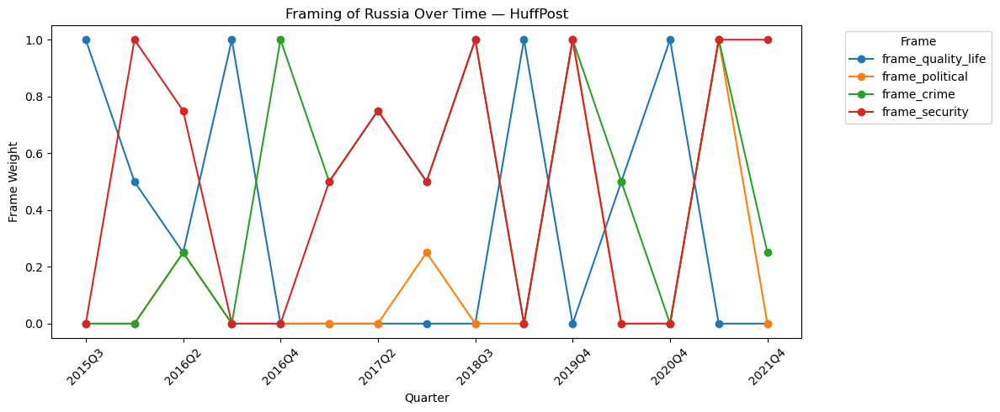

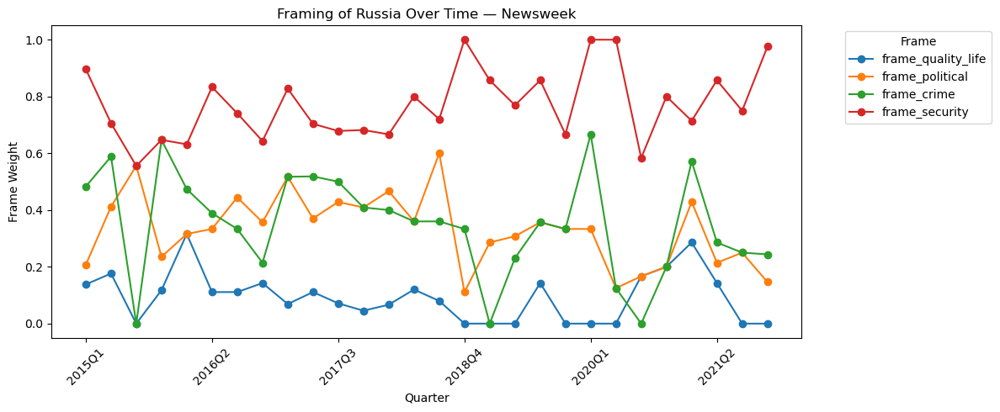

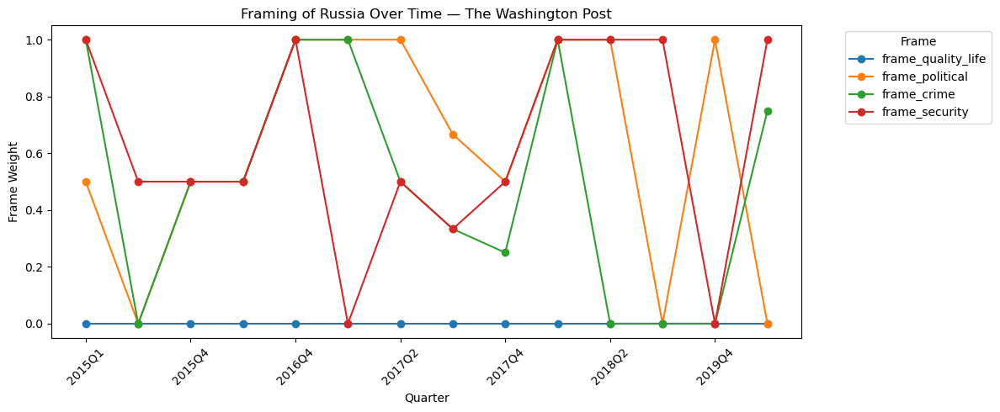

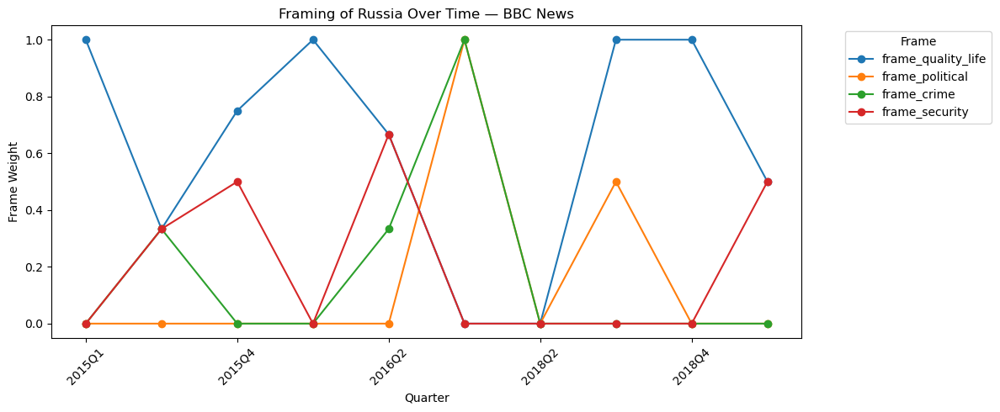

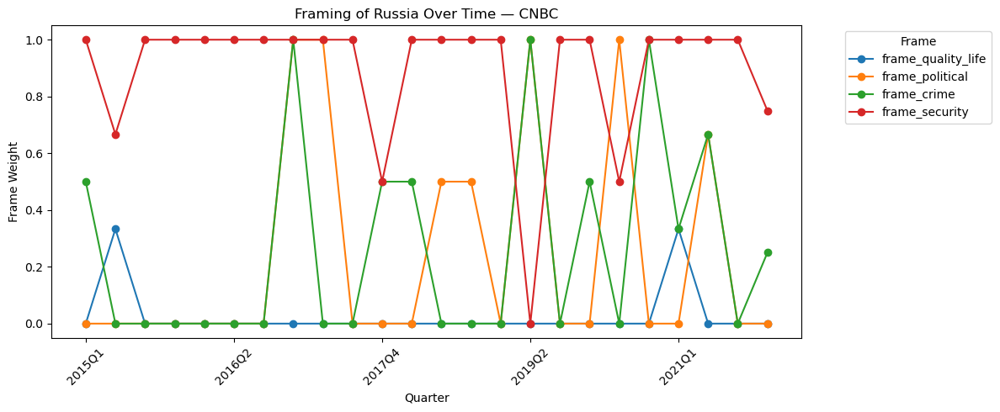

...

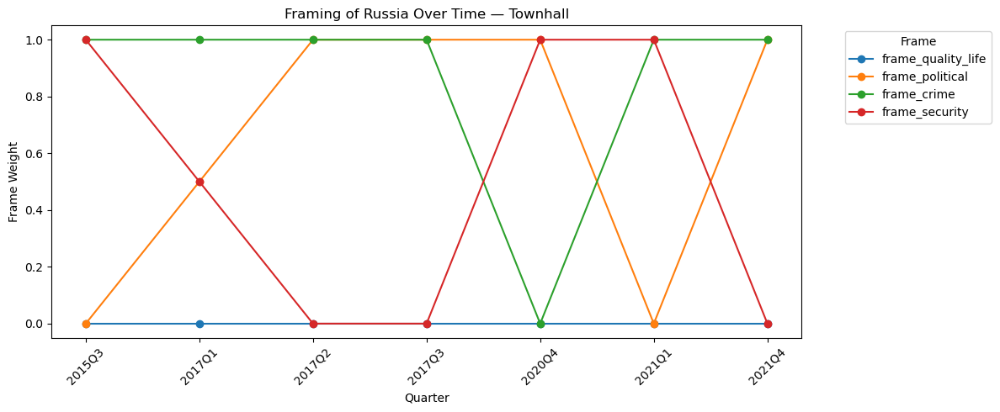

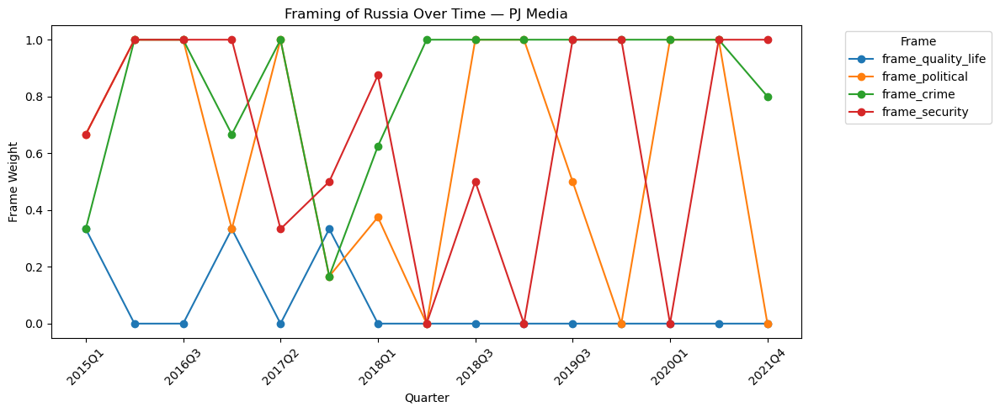

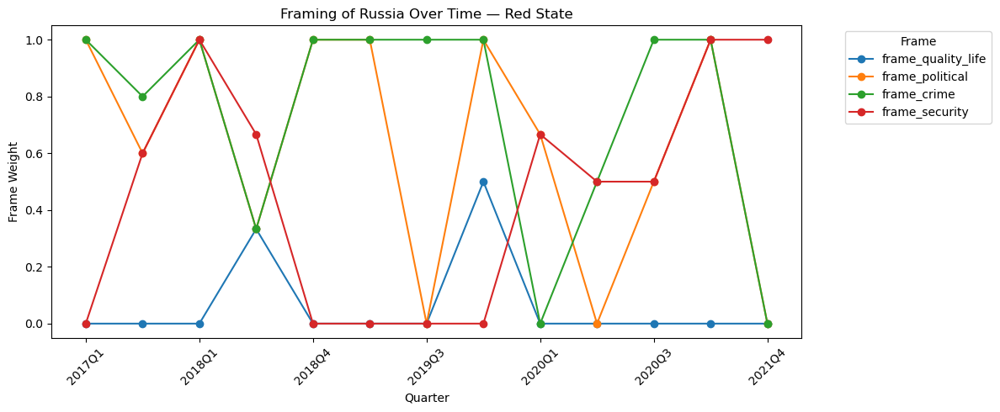

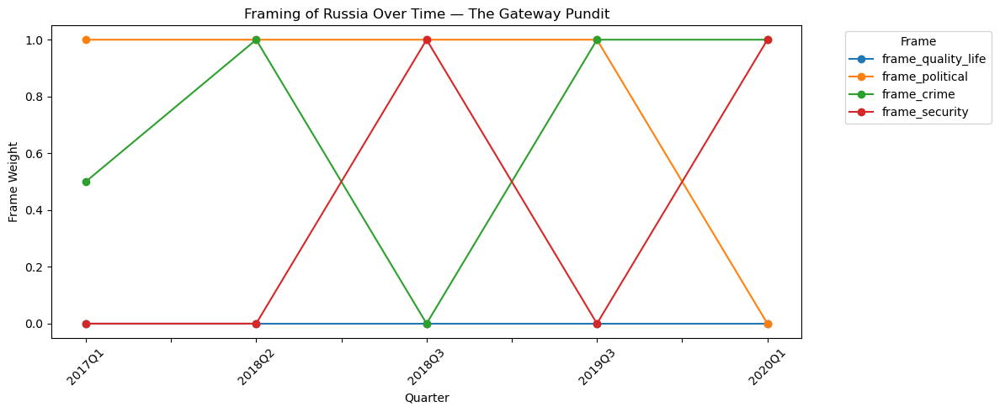

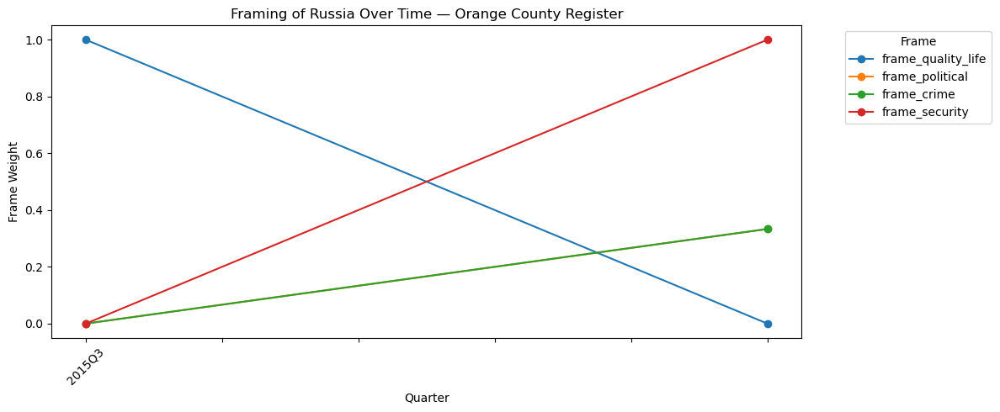

In [7]:
# Framing Differences for Russia over time by outlet
for outlet in outlets:        
    Russia_time = Russia.groupby(["quarter","outlet_name"])[frame_cols].mean()
    # isolate chosen outlet
    Russia_time_outlet = Russia_time.xs(outlet, level="outlet_name")
    
    # plot
    ax = Russia_time_outlet[high_var_frames].plot(figsize=(12,5), marker='o')
    plt.title(f"Framing of Russia Over Time — {outlet}")
    plt.ylabel("Frame Weight")
    plt.xlabel("Quarter")
    plt.xticks(rotation=45)
    plt.legend(title="Frame", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

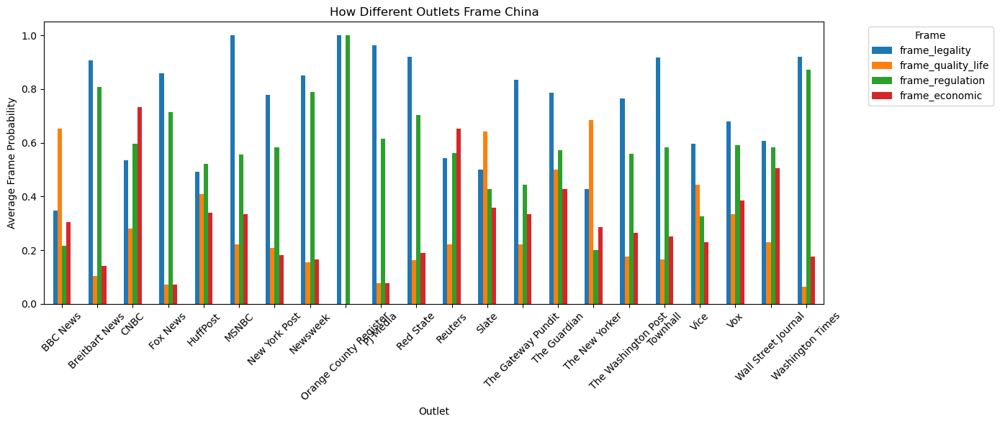

In [8]:
# Framing Differences for China
topic = "China"

frame_var = topic_variance.loc[topic]
cutoff = frame_var.quantile(0.75)

high_var_frames = frame_var[frame_var >= cutoff].sort_values(ascending=False).index.tolist()
China = df[df["topic_top1"] == topic]
frame_by_outlet_China = China.groupby("outlet_name")[frame_cols].mean()[high_var_frames]


ax = frame_by_outlet_China.plot(kind="bar", figsize=(14,6))
plt.title("How Different Outlets Frame China")
plt.ylabel("Average Frame Probability")
plt.xlabel("Outlet")
plt.xticks(rotation=45)
plt.legend(title="Frame", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

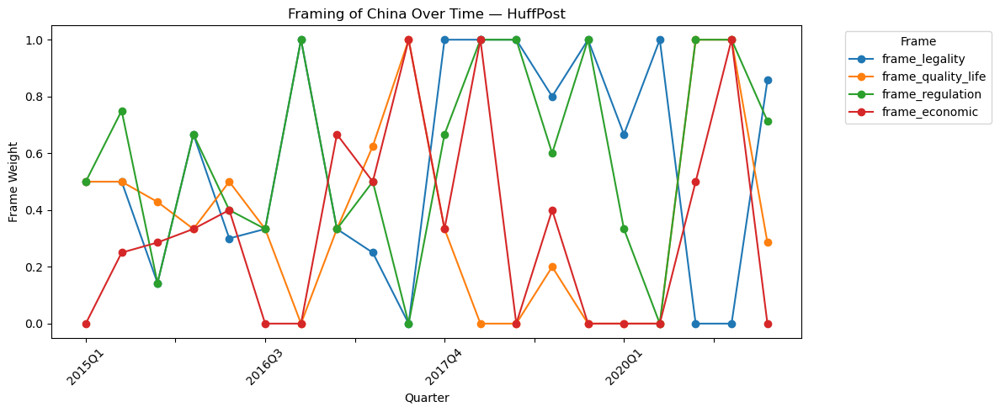

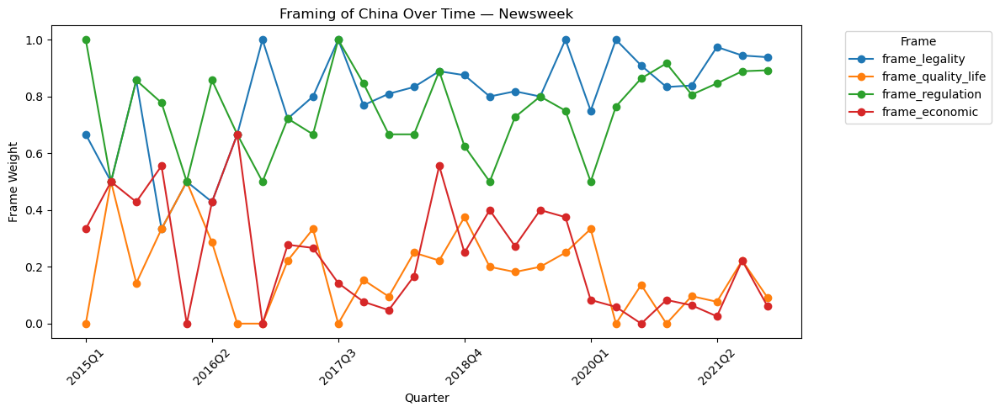

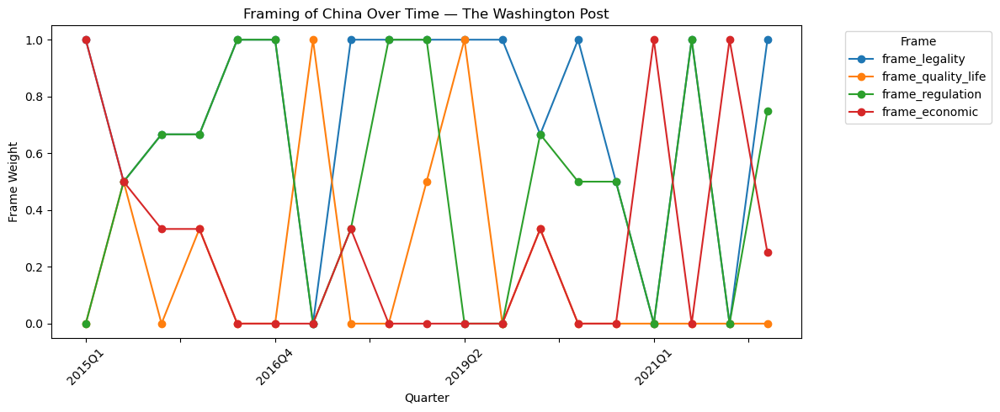

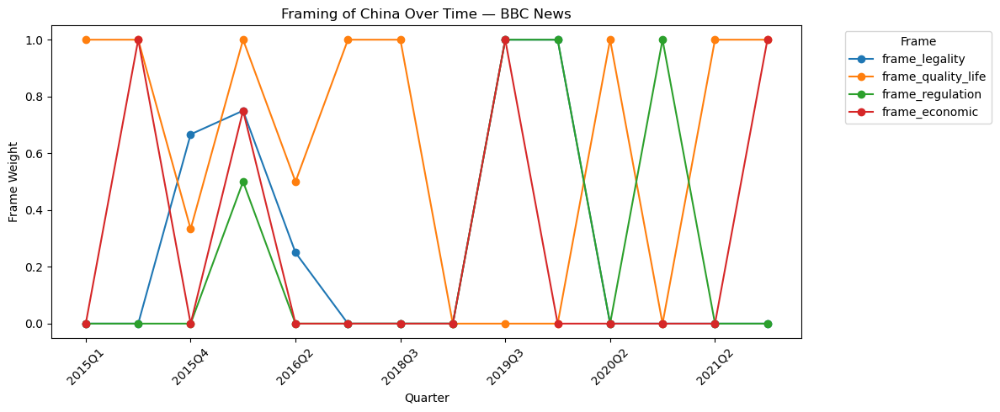

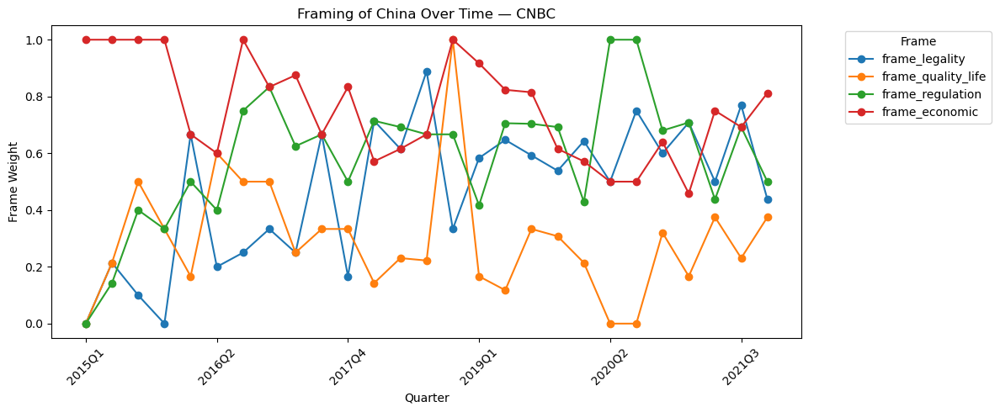

...

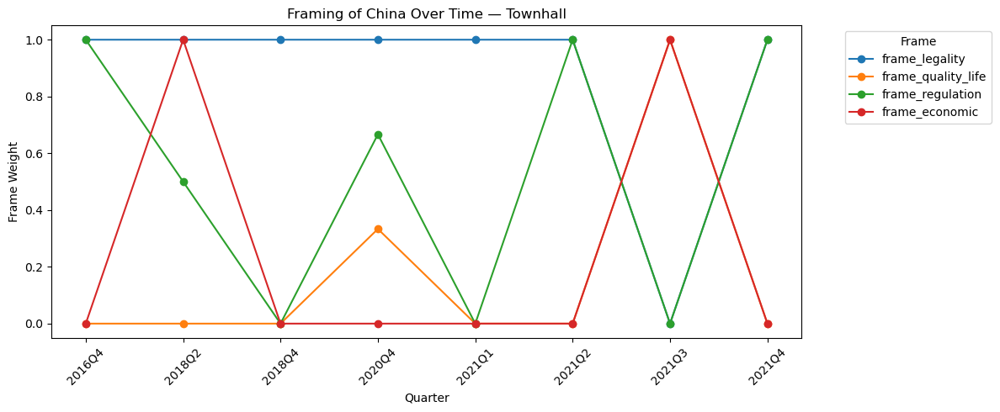

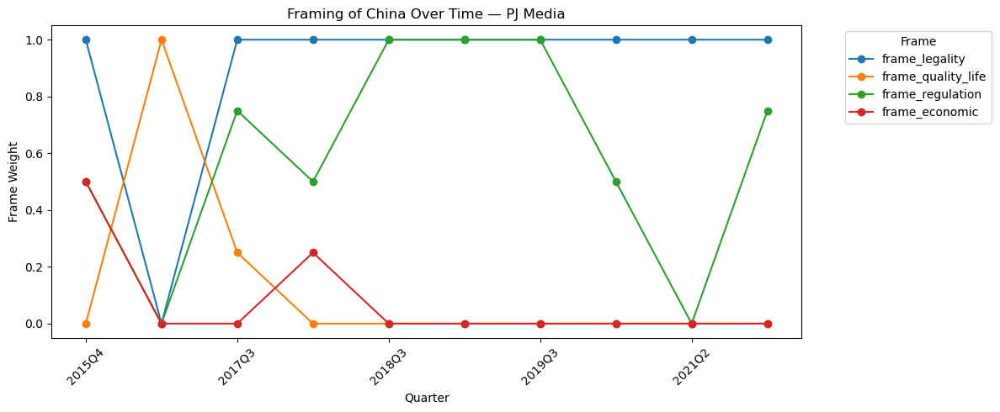

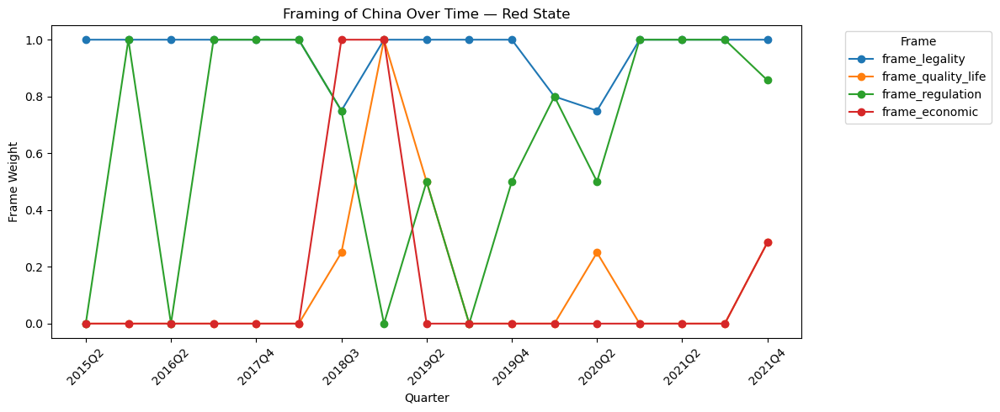

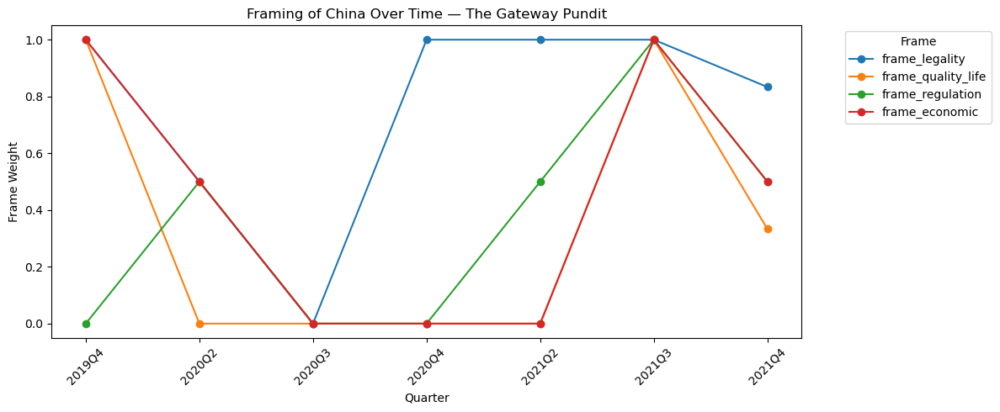

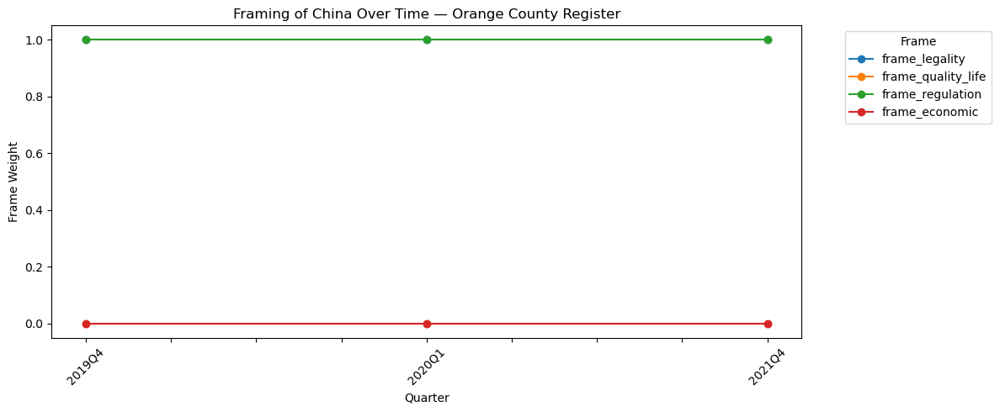

In [9]:
# Framing Differences for China over time by outlet
for outlet in outlets:        
    China_time = China.groupby(["quarter","outlet_name"])[frame_cols].mean()
    # isolate chosen outlet
    China_time_outlet = China_time.xs(outlet, level="outlet_name")
    
    # plot
    ax = China_time_outlet[high_var_frames].plot(figsize=(12,5), marker='o')
    plt.title(f"Framing of China Over Time — {outlet}")
    plt.ylabel("Frame Weight")
    plt.xlabel("Quarter")
    plt.xticks(rotation=45)
    plt.legend(title="Frame", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

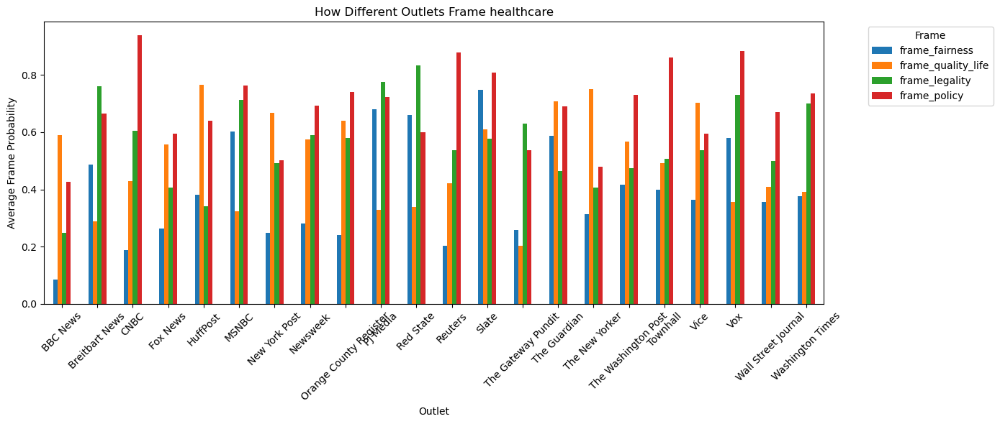

In [10]:
# Framing Differences for healthcare
topic = "healthcare"

frame_var = topic_variance.loc[topic]
cutoff = frame_var.quantile(0.75)

high_var_frames = frame_var[frame_var >= cutoff].sort_values(ascending=False).index.tolist()
healthcare = df[df["topic_top1"] == topic]
frame_by_outlet_healthcare = healthcare.groupby("outlet_name")[frame_cols].mean()[high_var_frames]


ax = frame_by_outlet_healthcare.plot(kind="bar", figsize=(14,6))
plt.title("How Different Outlets Frame healthcare")
plt.ylabel("Average Frame Probability")
plt.xlabel("Outlet")
plt.xticks(rotation=45)
plt.legend(title="Frame", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

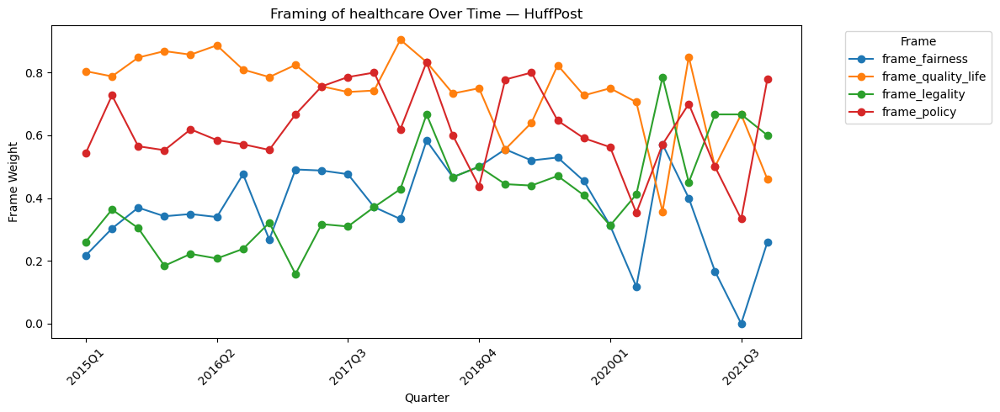

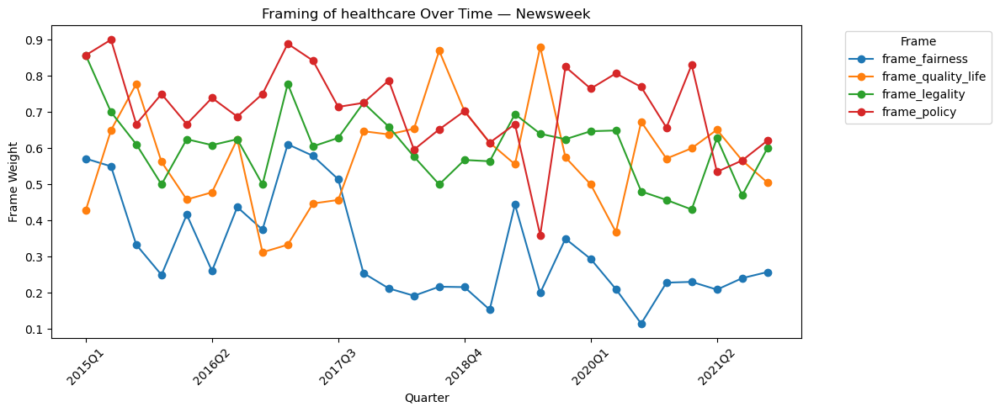

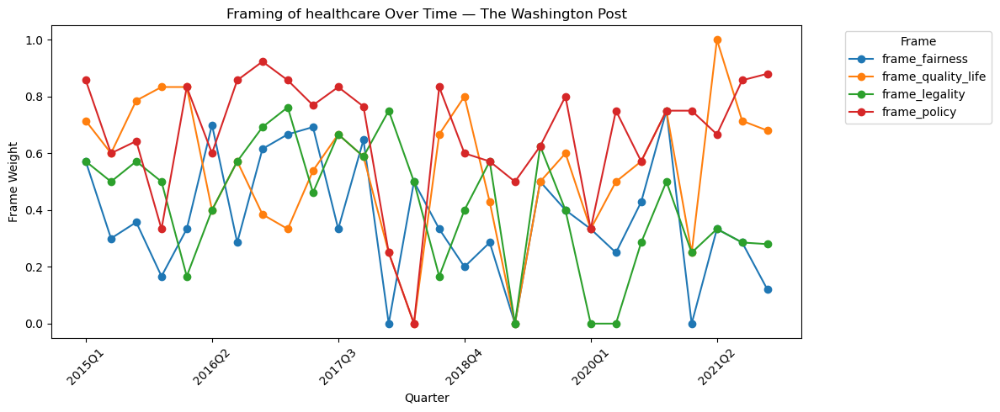

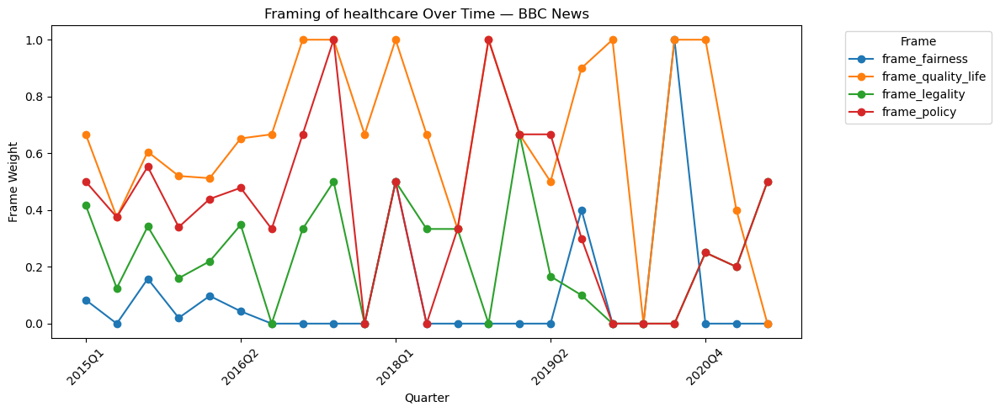

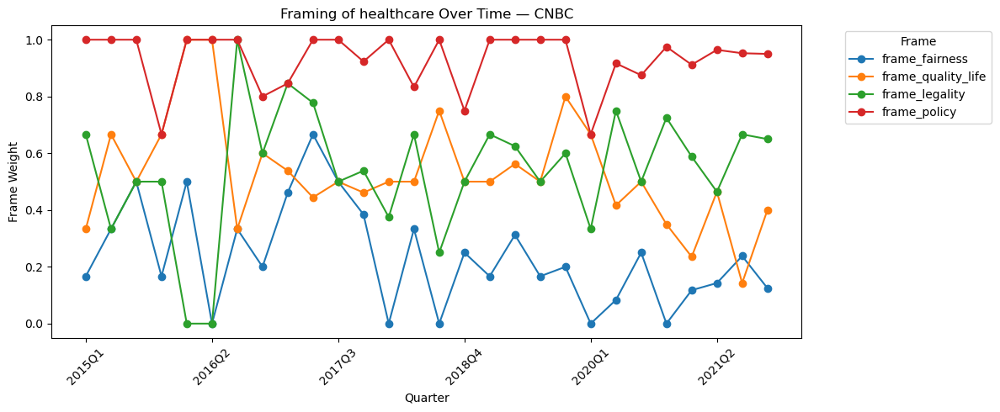

...

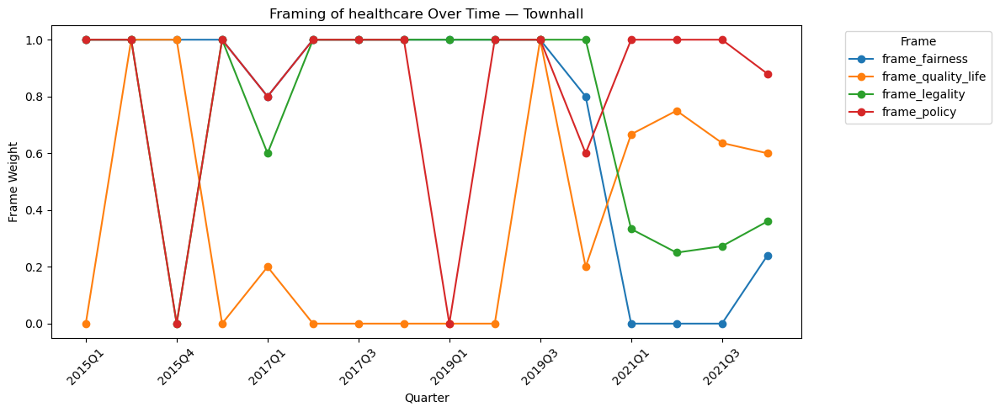

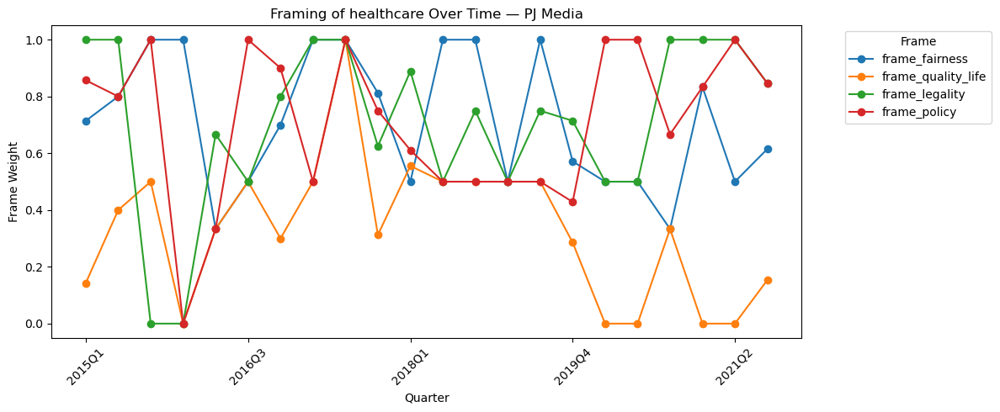

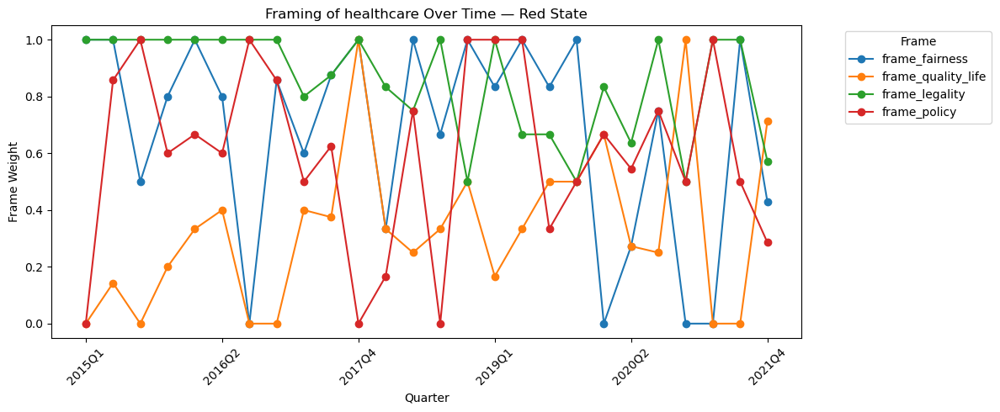

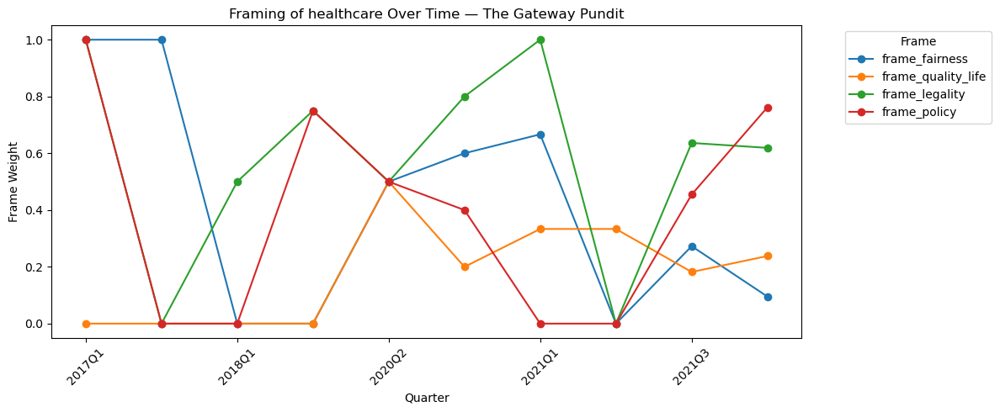

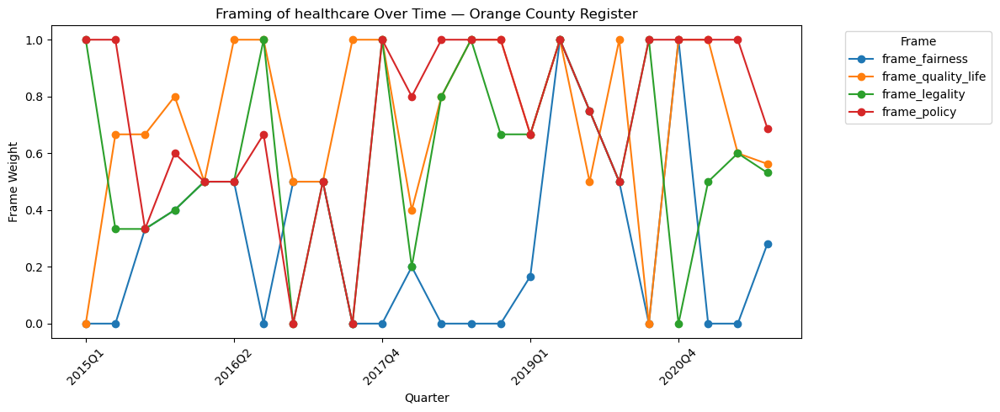

In [11]:
# Framing Differences for healthcare over time by outlet
for outlet in outlets:        
    healthcare_time = healthcare.groupby(["quarter","outlet_name"])[frame_cols].mean()
    # isolate chosen outlet
    healthcare_time_outlet = healthcare_time.xs(outlet, level="outlet_name")
    
    # plot
    ax = healthcare_time_outlet[high_var_frames].plot(figsize=(12,5), marker='o')
    plt.title(f"Framing of healthcare Over Time — {outlet}")
    plt.ylabel("Frame Weight")
    plt.xlabel("Quarter")
    plt.xticks(rotation=45)
    plt.legend(title="Frame", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()